In [1]:
require(data.table)
require(dada2)
require(phyloseq)
require(DESeq2)
require(genefilter)
require(ggplot2)
require(vegan)
require(RColorBrewer)
require(metacoder)
options(repr.plot.width=20, repr.plot.height=15)

Loading required package: data.table

Loading required package: dada2

Loading required package: Rcpp

Loading required package: phyloseq

Loading required package: DESeq2

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:data.table’:

    first, second


The following objects are ma

In [2]:
meta=fread("~/Documents/DE/DE_16S/DE16S_allmeta.csv")
asv_all=fread("~/Documents/DE/DE_16S/ASVs/Run123_ASV_nochim.csv")
taxa=read.csv("~/Documents/DE/DE_16S/ASVs/Run123_taxa.csv", header=TRUE, row.names=1)

In [3]:
#fix rownames
rows=as.vector(asv_all[,1])
asv_all=asv_all[,-1]
asv_all=apply(asv_all, 2, as.numeric)
row.names(asv_all)=rows$V1

In [4]:
#negative controls 
negs=meta[meta$Experiment=="Negative",]
negcounts=asv_all[row.names(asv_all) %in% negs$UniqueID,]
remove=negcounts[,colSums(negcounts)>0]
#asv_all=asv_all[,!colnames(asv_all) %in% colnames(remove)]

In [5]:
#pull out the dilution effect samples
meta_de=meta[meta$Experiment=="Field17"|meta$Experiment=="Lab18",]

In [6]:
meta_de17=meta[meta$Experiment=="Field17",]

In [7]:
asv_de17=asv_all[rownames(asv_all) %in% meta_de17$UniqueID,]

In [10]:
#write.csv(asv_de17, file="~/Documents/DE/DE_16S/asvtable_de17.csv")

In [11]:
#write.csv(meta_de17, file="~/Documents/DE/DE_16S/metadata_de17.csv")

In [8]:
meta_de18=meta[meta$Experiment=="Lab18",]

In [9]:
asv_de18=asv_all[rownames(asv_all) %in% meta_de18$UniqueID,]

In [14]:
#write.csv(asv_de18, file="~/Documents/DE/DE_16S/asvtable_de18.csv")

In [15]:
#write.csv(meta_de18, file="~/Documents/DE/DE_16S/metadata_de18.csv")

In [10]:
asv_de=asv_all[rownames(asv_all) %in% meta_de$UniqueID,]

In [11]:
dim(asv_de)

[1]   212 16383

In [12]:
asv_de=asv_de[rowSums(asv_de)>10000,]

In [13]:
dim(asv_de)

[1]   192 16383

In [14]:
dim(asv_de)

[1]   192 16383

In [15]:
asv_de=asv_de[,colSums(asv_de)>0]

In [16]:
#make taxa list that just applies to de samples
taxa_de=taxa[rownames(taxa)%in% colnames(asv_de),]

In [17]:
#for some reason the bracket subsetting was having a hard time with the NAs
taxa_de_clean=subset(taxa_de, Kingdom!="Eukaryota"|is.na(Order))
taxa_de_clean=subset(taxa_de_clean, Order!="Chloroplast"|is.na(Order))

In [18]:
taxa_de=as.matrix(taxa_de_clean)
meta_de=as.data.frame(meta_de)
row.names(meta_de)=meta_de$UniqueID

In [45]:
OTU = otu_table((asv_de), taxa_are_rows = FALSE)
TAX = tax_table(taxa_de)
SAMP=sample_data(meta_de)


 AM  CV  IR  MB 
  6 171  30   6 

In [107]:
SAMP$Species=gsub("MM", "AM", SAMP$Species)

In [108]:
OTU=transform_sample_counts(OTU, function(x) 1E6 * x/sum(x))

# how similar are microbiomes across studies (field/lab, VA/MD, 2017/2018)

In [31]:
# convert the sample_data() within a phyloseq object to a vegan compatible data object
pssd2veg <- function(physeq) {
  sd <- sample_data(physeq)
  return(as(sd,"data.frame"))
}

# convert the otu_table() within a phyloseq object to a vegan compatible data object
psotu2veg <- function(physeq) {
  OTU <- otu_table(physeq)
  if (taxa_are_rows(OTU)) {
    OTU <- t(OTU)
  }
  return(as(OTU, "matrix"))
}

In [109]:
DE = phyloseq(OTU, TAX, SAMP)

In [111]:
DE_samp=sample_data(DE)

In [114]:
DE_samp

,V1,UniqueID,Experiment,Year,Site,Treatment1_Density,Treatment2_Diversity,Color_Bucket,Number,Species,RFTM_score,peacrabs,Phase_1_DO,Phase_1_temp,Phase_2_DO,Phase_2_Temp,Overall_treatment
,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
2017_NW_HIGH_MONO_B1_CV,1,2017_NW_HIGH_MONO_B1_CV,Field17,2017,NW,HIGH,MONO,B,1,CV,1.0,0,,,,,
2017_NW_HIGH_MONO_B11_CV,2,2017_NW_HIGH_MONO_B11_CV,Field17,2017,NW,HIGH,MONO,B,11,CV,2.0,0,,,,,
2017_NW_HIGH_MONO_B12_CV,3,2017_NW_HIGH_MONO_B12_CV,Field17,2017,NW,HIGH,MONO,B,12,CV,0.0,0,,,,,
2017_NW_HIGH_MONO_B14_CV,4,2017_NW_HIGH_MONO_B14_CV,Field17,2017,NW,HIGH,MONO,B,14,CV,1.0,0,,,,,
2017_NW_HIGH_MONO_B18_CV,5,2017_NW_HIGH_MONO_B18_CV,Field17,2017,NW,HIGH,MONO,B,18,CV,4.0,0,,,,,
2017_NW_HIGH_MONO_P1_CV,6,2017_NW_HIGH_MONO_P1_CV,Field17,2017,NW,HIGH,MONO,P,1,CV,1.0,0,,,,,
2017_NW_HIGH_MONO_P12_CV,9,2017_NW_HIGH_MONO_P12_CV,Field17,2017,NW,HIGH,MONO,P,12,CV,2.0,0,,,,,
2017_NW_HIGH_MONO_P14_CV,10,2017_NW_HIGH_MONO_P14_CV,Field17,2017,NW,HIGH,MONO,P,14,CV,2.0,1,,,,,
2017_NW_HIGH_MONO_P16_CV,11,2017_NW_HIGH_MONO_P16_CV,Field17,2017,NW,HIGH,MONO,P,16,CV,2.0,0,,,,,


In [113]:
table(DE_samp$Species, DE_samp$Experiment)

    
     Field17 Lab18
  AM       0     5
  CV      98    53
  IR       0    30
  MB       0     6

In [92]:
DE.ord <- ordinate(DE, "NMDS", "bray", trymax=1000)

Square root transformation
Wisconsin double standardization
Run 0 stress 0.1540216 
Run 1 stress 0.1699241 
Run 2 stress 0.1597795 
Run 3 stress 0.1540004 
... New best solution
... Procrustes: rmse 0.002219587  max resid 0.02991509 
Run 4 stress 0.1586683 
Run 5 stress 0.1714076 
Run 6 stress 0.1637577 
Run 7 stress 0.1615304 
Run 8 stress 0.1598037 
Run 9 stress 0.1539981 
... New best solution
... Procrustes: rmse 0.0003821169  max resid 0.004381202 
... Similar to previous best
Run 10 stress 0.1619653 
Run 11 stress 0.1740135 
Run 12 stress 0.1645887 
Run 13 stress 0.1617205 
Run 14 stress 0.1644037 
Run 15 stress 0.1642804 
Run 16 stress 0.1620215 
Run 17 stress 0.1617244 
Run 18 stress 0.1675318 
Run 19 stress 0.158305 
Run 20 stress 0.1595137 
*** Solution reached


In [93]:
mycolors= colorRampPalette(brewer.pal(8, "Accent"))(4)


In [95]:
DE.ord


Call:
metaMDS(comm = veganifyOTU(physeq), distance = distance, trymax = 1000) 

global Multidimensional Scaling using monoMDS

Data:     wisconsin(sqrt(veganifyOTU(physeq))) 
Distance: bray 

Dimensions: 2 
Stress:     0.1539981 
Stress type 1, weak ties
Two convergent solutions found after 20 tries
Scaling: centring, PC rotation, halfchange scaling 
Species: expanded scores based on ‘wisconsin(sqrt(veganifyOTU(physeq)))’ 


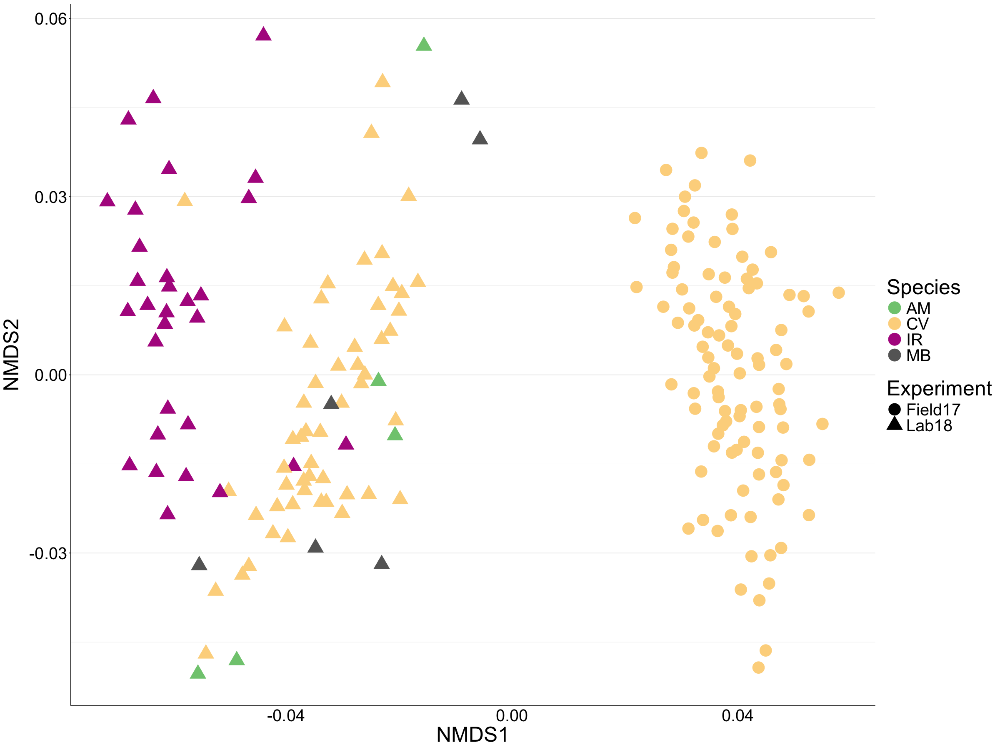

In [94]:
plot_ordination(DE, DE.ord, type="samples", color="Species", shape="Experiment")+ 
#facet_wrap("Species")+
#geom_polygon(aes(fill=Phase_1_DO))+ 
scale_color_manual(values=mycolors)+
geom_point(size=8)+
theme_bw()+
 theme(legend.position="right", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text=element_text(color="black"),
          text = element_text(size=30))

In [96]:
ggsave(file="~/Documents/DE/16S_manuscript/Submit/Figure1.pdf", width = 15, height=10)

In [99]:
DEsd=pssd2veg(DE)
DEotu=psotu2veg(DE)

In [100]:
adonis2(vegdist(DEotu, method="bray") ~ Experiment/Species, data=DEsd)

,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Experiment,1,7.36450,0.1154942,29.71681,0.001
Experiment:Species,3,10.05778,0.1577316,13.52819,0.001
Residual,187,46.34285,0.7267742,NA,NA
Total,191,63.76513,1.0000000,NA,NA


In [34]:
meta17growth=fread("~/Documents/DE/DE_16S/meta17_growth.csv")
meta18growth=fread("~/Documents/DE/DE_16S/meta18_growth.csv")

In [35]:
metagrowth=rbind(meta17growth, meta18growth)
metagrowth=na.omit(metagrowth)
metagrowth=as.data.frame(merge(meta, metagrowth, by="UniqueID"))

In [36]:
row.names(metagrowth)=metagrowth$UniqueID

In [37]:
SAMP=sample_data(metagrowth)

In [39]:
DEG = phyloseq(OTU, TAX, SAMP)

In [51]:
DE_CV = subset_samples(DE, Species%in%c("CV"))
DE_IR = subset_samples(DE, Species%in%c("IR"))


In [52]:
DEsd=pssd2veg(DE_CV)
DEotu=psotu2veg(DE_CV)

In [43]:
adonis2(vegdist(DEotu, method="bray") ~ Experiment+Weight_delta+Volume_scale, data=DEsd)

,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Experiment,1,3.5403890,0.096634920,13.9629120,0.001
Weight_delta,1,0.2202450,0.006011588,0.8686226,0.567
Volume_scale,1,0.1673057,0.004566608,0.6598354,0.839
Residual,129,32.7088061,0.892786883,NA,NA
Total,132,36.6367458,1.000000000,NA,NA


In [66]:
DEsd=pssd2veg(DEG_IR)
DEotu=psotu2veg(DEG_IR)

In [67]:
adonis2(vegdist(DEotu, method="bray") ~ Weight_delta+Volume_scale, data=DEsd)

,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Weight_delta,1,0.1760777,0.04226503,1.075377,0.388
Volume_scale,1,0.2240369,0.05377698,1.368283,0.219
Residual,23,3.7659225,0.90395800,NA,NA
Total,25,4.1660371,1.00000000,NA,NA


In [54]:
CV = subset_samples(DE, Species%in%c("CV"))


# Species differences

In [55]:
DE17=subset_samples(DE, Year=="2017")
DE17=prune_taxa(taxa_sums(DE17)>0, DE17)


DE18=subset_samples(DE, Year=="2018")
DE18=prune_taxa(taxa_sums(DE18)>0, DE18)


In [56]:
DE17CV=subset_samples(DE17, Species=="CV")
DE18CV=subset_samples(DE18, Species=="CV")
DE18M=subset_samples(DE18, Species=="MB"| Species=="MM")
DE18MB=subset_samples(DE18, Species=="MB")
DE18MM=subset_samples(DE18, Species=="AM")
DE18IR=subset_samples(DE18, Species=="IR")

In [57]:
DE17CV_g=tax_glom(DE17CV, taxrank = "Genus")
DE18CV_g=tax_glom(DE18CV, taxrank = "Genus")
DE18MB_g=tax_glom(DE18MB, taxrank = "Genus")
DE18MM_g=tax_glom(DE18MM, taxrank = "Genus")
DE18IR_g=tax_glom(DE18IR, taxrank = "Genus")

In [58]:
DE17CV_o=tax_glom(DE17CV, taxrank = "Order")
DE18CV_o=tax_glom(DE18CV, taxrank = "Order")
DE18MB_o=tax_glom(DE18MB, taxrank = "Order")
DE18MM_o=tax_glom(DE18MM, taxrank = "Order")
DE18IR_o=tax_glom(DE18IR, taxrank = "Order")

In [59]:
#top 10 taxa
DE17CV_100 = prune_taxa(names(sort(taxa_sums(DE17CV_o),TRUE)[1:10]), DE17CV)
DE18CV_100 = prune_taxa(names(sort(taxa_sums(DE18CV_o),TRUE)[1:10]), DE18CV)
DE18MB_100 = prune_taxa(names(sort(taxa_sums(DE18MB_o),TRUE)[1:10]), DE18MB)
DE18MM_100 = prune_taxa(names(sort(taxa_sums(DE18MM_o),TRUE)[1:10]), DE18MM)
DE18IR_100 = prune_taxa(names(sort(taxa_sums(DE18IR_o),TRUE)[1:10]), DE18IR)

DE_species100=merge_phyloseq(DE18CV_100, DE18MB_100, DE18IR_100, DE18MM_100, DE17CV_100)

In [60]:
DE_species100=merge_phyloseq(DE18CV_100, DE18MB_100, DE18IR_100, DE18MM_100, DE17CV_100)

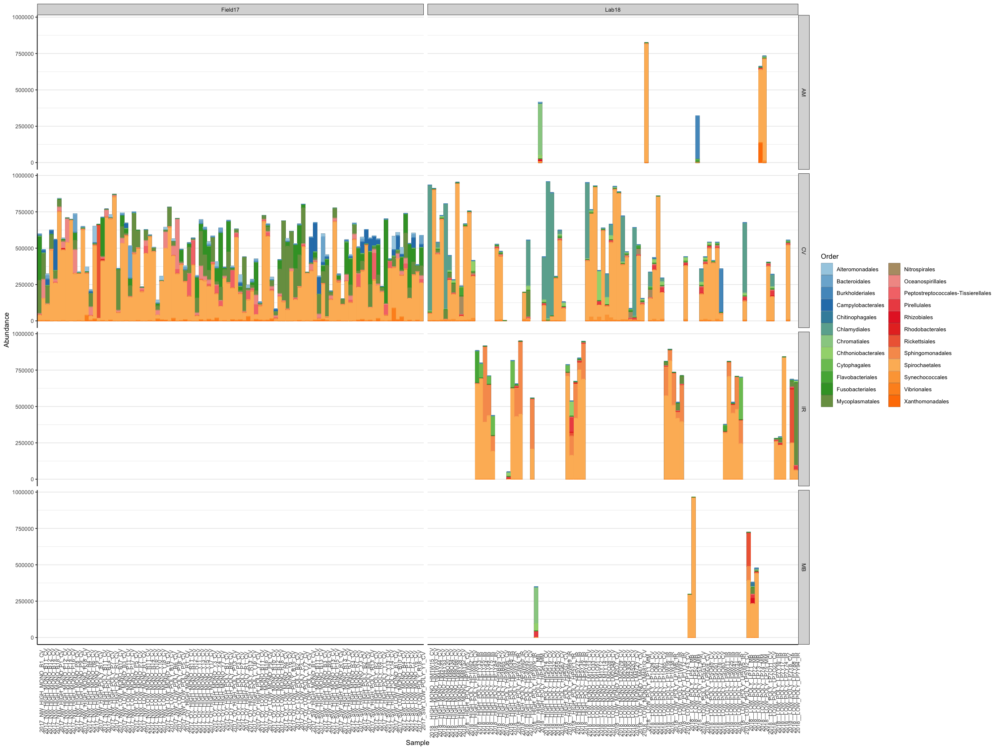

In [61]:
mycolors= colorRampPalette(brewer.pal(8, "Paired"))(24)

plot_bar(DE_species100,  fill="Order") +
facet_grid(Species~Experiment, scales="free_x", space="free")+
geom_bar(aes(color=Order, fill=Order), stat="identity", position="stack")+
scale_fill_manual(values=mycolors, drop=TRUE)+
scale_color_manual(values=mycolors, drop=TRUE)+
theme_bw()+
theme(legend.position="right", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text.x=element_text(angle=90),
          text = element_text(size=10))

In [152]:
ggsave(file="~/Documents/DE/Figures/Top10taxa_divided.pdf", width = 15, height=10)

In [253]:
ggsave(width=20, height=10, file="~/Documents/DE/DE_16S/Species_comp.pdf")

In [140]:
DE18.ord <- ordinate(DE18, "NMDS", "bray", trymax=100)

Square root transformation
Wisconsin double standardization
Run 0 stress 0.1915723 
Run 1 stress 0.2133608 
Run 2 stress 0.1915723 
... Procrustes: rmse 2.098098e-05  max resid 0.0001531527 
... Similar to previous best
Run 3 stress 0.2303695 
Run 4 stress 0.1918741 
... Procrustes: rmse 0.01455265  max resid 0.131801 
Run 5 stress 0.1915723 
... Procrustes: rmse 2.211635e-05  max resid 0.0001564909 
... Similar to previous best
Run 6 stress 0.227372 
Run 7 stress 0.2236037 
Run 8 stress 0.2128268 
Run 9 stress 0.2013803 
Run 10 stress 0.1915724 
... Procrustes: rmse 3.783114e-05  max resid 0.0002737418 
... Similar to previous best
Run 11 stress 0.1915724 
... Procrustes: rmse 4.09906e-05  max resid 0.00026774 
... Similar to previous best
Run 12 stress 0.2013803 
Run 13 stress 0.1915724 
... Procrustes: rmse 7.23573e-05  max resid 0.0005189811 
... Similar to previous best
Run 14 stress 0.2410199 
Run 15 stress 0.1915977 
... Procrustes: rmse 0.01163191  max resid 0.103571 
Run 16 st

In [146]:
DE18.ord


Call:
metaMDS(comm = veganifyOTU(physeq), distance = distance, trymax = 100) 

global Multidimensional Scaling using monoMDS

Data:     wisconsin(sqrt(veganifyOTU(physeq))) 
Distance: bray 

Dimensions: 2 
Stress:     0.1915723 
Stress type 1, weak ties
Two convergent solutions found after 20 tries
Scaling: centring, PC rotation, halfchange scaling 
Species: expanded scores based on ‘wisconsin(sqrt(veganifyOTU(physeq)))’ 


In [143]:
mycolors= colorRampPalette(brewer.pal(8, "Accent"))(4)

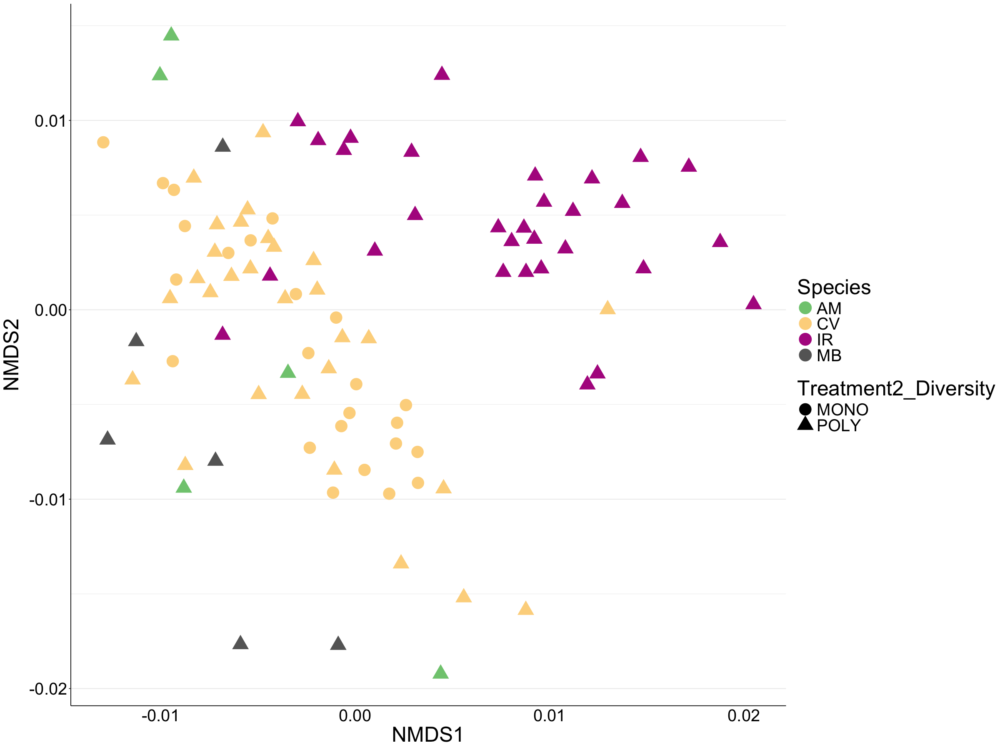

In [144]:
plot_ordination(DE18, DE18.ord, type="samples", color="Species", shape="Treatment2_Diversity")+ 
#facet_wrap("Species")+
#geom_polygon(aes(fill=Phase_1_DO))+ 
scale_color_manual(values=mycolors)+
geom_point(size=8)+
theme_bw()+
 theme(legend.position="right", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text=element_text(color="black"),
          text = element_text(size=30))

In [145]:
ggsave(file="~/Documents/DE/16S_manuscript/Submit/FigureS7.pdf", width = 15, height=10)

In [101]:
DE18sd=pssd2veg(DE18)
DE18otu=psotu2veg(DE18)

In [102]:
adonis2(vegdist(DE18otu, method="bray") ~ Treatment1_Density*Species,  data=DE18sd)


,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Treatment1_Density,1,0.7187052,0.02209349,3.026082,0.014
Species,3,10.0776135,0.30979281,14.143806,0.001
Treatment1_Density:Species,3,1.3085472,0.04022565,1.836530,0.018
Residual,86,20.4253068,0.62788805,NA,NA
Total,93,32.5301727,1.00000000,NA,NA


In [62]:
DE18CVsd=pssd2veg(DE18CV)
DE18CVotu=psotu2veg(DE18CV)

In [63]:
adonis2(vegdist(DE18CVotu, method="bray") ~ Treatment1_Density*Treatment2_Diversity,  data=DE18CVsd)


,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Treatment1_Density,1,0.3966710,0.02723003,1.4202585,0.132
Treatment2_Diversity,1,0.2834604,0.01945853,1.0149141,0.363
Treatment1_Density:Treatment2_Diversity,1,0.2018280,0.01385476,0.7226338,0.694
Residual,49,13.6854526,0.93945669,NA,NA
Total,52,14.5674120,1.00000000,NA,NA


In [83]:
adonis2(vegdist(DE18otu, method="bray") ~ Treatment1_Density*Species,  data=DE18sd)


,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Treatment1_Density,1,0.5534793,0.01591467,2.183719,0.040
Species,3,9.5644177,0.27501397,12.578610,0.001
Treatment1_Density:Species,3,1.3419740,0.03858694,1.764892,0.012
Residual,92,23.3180630,0.67048442,NA,NA
Total,99,34.7779340,1.00000000,NA,NA


## Core ASVs

In [101]:
CV=subset_samples(DE, Species=="CV")

In [102]:
CV

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 14347 taxa and 151 samples ]
sample_data() Sample Data:       [ 151 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 14347 taxa by 6 taxonomic ranks ]

In [103]:
DE17CV

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 7662 taxa and 98 samples ]
sample_data() Sample Data:       [ 98 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 7662 taxa by 6 taxonomic ranks ]

In [104]:
DE18CV

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 7180 taxa and 53 samples ]
sample_data() Sample Data:       [ 53 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 7180 taxa by 6 taxonomic ranks ]

In [105]:
#what otus are present in every oyster?
flist= filterfun(kOverA(151, 0))
CV_all=phyloseq::filter_taxa(CV, flist, TRUE )
tax_table(CV_all)

,Kingdom,Phylum,Class,Order,Family,Genus
TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG,Bacteria,Spirochaetota,Spirochaetia,Spirochaetales,Spirochaetaceae,NA


In [69]:
#what otus are present in every 2017 oyster?
flist= filterfun(kOverA(98, 0))
CV_all=phyloseq::filter_taxa(DE17CV, flist, TRUE )
tax_table(CV_all)

,Kingdom,Phylum,Class,Order,Family,Genus
TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG,Bacteria,Spirochaetota,Spirochaetia,Spirochaetales,Spirochaetaceae,NA
TTCCAGCTCCAATAGCGTATATTAAAGTTGCTGCAGTTAAAAAGCTCGTAGCTGGATCTCGGGTCCAGGCTGGCGGTCCACCTCGTTGTGGTTACTGCCTGTTCTGACCCAACCTCTCGGTTGTAAACCCTTGGTGCTCTTGATTGAGTTGCTTCGGGTGGCCGAAACTTTTACTTTGAAAAAATTAGAGTGTTCAAAGCAGGCGATTCGCCTGCACAATGGTGCATGGAATAATGGAATAGGACCTCGGTTCTATTTTGTTGGTTTTCGGAACACGAGGTAATGATTAAGAGGGACTGACGGGGGCATTCGTATGGCGGGGTTAGAGGTGAAATTCTTGGATCCTCGCCAGACGGCCTACAGCGAAAGCATTTGCCAAGCATGTTTTCATTAGTCAAGAACGAAAGTCAGAGGTTCGAAGACG,Eukaryota,NA,NA,NA,NA,NA


In [70]:
#what otus are present in every 2018 oyster?
flist= filterfun(kOverA(53, 0))
CV_all=phyloseq::filter_taxa(DE18CV, flist, TRUE )
tax_table(CV_all)

,Kingdom,Phylum,Class,Order,Family,Genus
TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG,Bacteria,Spirochaetota,Spirochaetia,Spirochaetales,Spirochaetaceae,NA


In [71]:
DE18IR

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 7180 taxa and 30 samples ]
sample_data() Sample Data:       [ 30 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 7180 taxa by 6 taxonomic ranks ]

In [72]:
#what otus are present in every mussel?
flist= filterfun(kOverA(30, 0))
IR_all=phyloseq::filter_taxa(DE18IR, flist, TRUE )
tax_table(IR_all)

,Kingdom,Phylum,Class,Order,Family,Genus
TACGTATGGGGCAAACGTTGTTCGGATTCACTGGGCGTAAAGAGTACGTAGGCTGTCGAGACAGTCAATGATCAAATCCCGTAGCTTAACTACGTGGTCGTTGTTGATACTACTCGACTAGAGTTTTATAGAGGTAGCGGGAATTCCTGGTGTAGGGGTGAAATCTGTTGATATCAGGAGGAACACCAAAGGCGAAGGCAAGCTACTGGGTAAAAACTGACGCTGAGGTACGAAAGCCAGGGGAGCAAATGGG,Bacteria,Spirochaetota,Spirochaetia,Spirochaetales,Spirochaetaceae,NA


In [73]:
DE18MM

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 7180 taxa and 5 samples ]
sample_data() Sample Data:       [ 5 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 7180 taxa by 6 taxonomic ranks ]

In [74]:
#what otus are present in every MM?
flist= filterfun(kOverA(5, 0))
MM_all=phyloseq::filter_taxa(DE18MM, flist, TRUE )
tax_table(MM_all)

,Kingdom,Phylum,Class,Order,Family,Genus
TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG,Bacteria,Spirochaetota,Spirochaetia,Spirochaetales,Spirochaetaceae,NA
TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGTCTTGTAAGTCTGTTGTTAAAGCGTGGAGCTTAACTCCATTTCAGCAATGGAAACTGTAAGACTAGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATAACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,Bacteria,Cyanobacteria,Cyanobacteriia,Synechococcales,Cyanobiaceae,Cyanobium PCC-6307
GACGAACCGTACAAACGTTACTCGGAATTACTGGGCTTAAAGGGTGCGTAGGCTGCGCGGAAAGTTGGGTGTGAAAGCCCTCGGCTCAACCGAGGAATTGCATCCAAAACTACCGTGCTGGAGGGAGACAGAGGTAAGCGGAACTCAAGGTGGAGCGGTGAAATGCGTTGATATCTTGAGGAACACCGGTGGCGAAAGCGGCTTACTGGGTCTCTTCTGACGCTGAGGCACGAAAGCTAAGGTAGCAAACGGG,Bacteria,Planctomycetota,Planctomycetes,Pirellulales,Pirellulaceae,NA
TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGCCTTTTAAGTCTGTTGTTAAAGCGTGGAGCTTAACTCCATTTCAGCAATGGAAACTGGAAGGCTTGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATAACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,Bacteria,Cyanobacteria,Cyanobacteriia,Synechococcales,Cyanobiaceae,Cyanobium PCC-6307
GACGGAGGGGGCTAGCGTTGTTCGGAATTACTGGGCGTAAAGGGCGCGTAGGCGGATTAGTAAGTTGGGAGTGAAAGCCCGGGGCTTAACCTCGGAACTGCTTTCAAAACTGCTAGTCTTGAGTGAAGTAGGGGATGATGGAATTCCTAGTGTAGAGGTGAAATTCTTAGATATTAGGAGGAACACCGGTGGCGAAGGCGGTCATCTGGACTTCAACTGACGCTGAGGCGCGAAAGCGTGGGGAGCAAACAGG,Bacteria,Proteobacteria,Alphaproteobacteria,Rickettsiales,Rickettsiaceae,Candidatus Megaira


In [75]:
DE18MB

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 7180 taxa and 6 samples ]
sample_data() Sample Data:       [ 6 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 7180 taxa by 6 taxonomic ranks ]

In [76]:
#what otus are present in every MB?
flist= filterfun(kOverA(6, 0))
MB_all=phyloseq::filter_taxa(DE18MB, flist, TRUE )
tax_table(MB_all)

,Kingdom,Phylum,Class,Order,Family,Genus
TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG,Bacteria,Spirochaetota,Spirochaetia,Spirochaetales,Spirochaetaceae,NA
GACGAACCGTACAAACGTTACTCGGAATTACTGGGCTTAAAGGGTGCGTAGGCTGCGCGGAAAGTTGGGTGTGAAAGCCCTCGGCTCAACCGAGGAATTGCATCCAAAACTACCGTGCTGGAGGGAGACAGAGGTAAGCGGAACTCAAGGTGGAGCGGTGAAATGCGTTGATATCTTGAGGAACACCGGTGGCGAAAGCGGCTTACTGGGTCTCTTCTGACGCTGAGGCACGAAAGCTAAGGTAGCAAACGGG,Bacteria,Planctomycetota,Planctomycetes,Pirellulales,Pirellulaceae,NA


In [77]:
Core=merge_phyloseq(MM_all, MB_all, CV_all, IR_all)

In [78]:
DE_coreasv = subset(t(otu_table(DE)), rownames(t(otu_table(DE))) %in% colnames(otu_table(Core)))
DE_core = merge_phyloseq(DE_coreasv, tax_table(DE), sample_data(DE))

In [79]:
DE_core_otu=otu_table(DE_core)

In [80]:
is.na(DE_core_otu) <- DE_core_otu == 0


In [81]:
otu_table(DE_core)=DE_core_otu

In [82]:
(DE_core_otu)[,110:120]

,2018__HIGH_POLY_HP1W63_CV,2018__HIGH_POLY_HP1Y33_IR,2018__HIGH_POLY_HP1Y55_IR,2018__HIGH_POLY_HP1Y64_IR,2018__HIGH_POLY_HP1Y75_IR,2018__HIGH_POLY_HP1Y84_IR,2018__HIGH_POLY_HP3B59_CV,2018__HIGH_POLY_HP3B65_CV,2018__HIGH_POLY_HP3W36_CV,2018__HIGH_POLY_HP3W36_IR,2018__HIGH_POLY_HP3W37_IR
TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG,289429.6648,218.1890,196.9118,277.1289,237.4733,123.3749,493223.0500,438622.0435,516.6179,345596.4869,205.08351
TACGTATGGGGCAAACGTTGTTCGGATTCACTGGGCGTAAAGAGTACGTAGGCTGTCGAGACAGTCAATGATCAAATCCCGTAGCTTAACTACGTGGTCGTTGTTGATACTACTCGACTAGAGTTTTATAGAGGTAGCGGGAATTCCTGGTGTAGGGGTGAAATCTGTTGATATCAGGAGGAACACCAAAGGCGAAGGCAAGCTACTGGGTAAAAACTGACGCTGAGGTACGAAAGCCAGGGGAGCAAATGGG,320.7992,655499.3554,691865.9031,390910.1706,437154.3916,191724.6272,378.8357,949.8781,928500.0861,536.7163,623261.59683
TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGTCTTGTAAGTCTGTTGTTAAAGCGTGGAGCTTAACTCCATTTCAGCAATGGAAACTGTAAGACTAGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATAACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,17941.8437,NA,787.6471,NA,NA,200.4842,4861.7250,8010.6386,688.8238,17565.2598,51.27088
GACGAACCGTACAAACGTTACTCGGAATTACTGGGCTTAAAGGGTGCGTAGGCTGCGCGGAAAGTTGGGTGTGAAAGCCCTCGGCTCAACCGAGGAATTGCATCCAAAACTACCGTGCTGGAGGGAGACAGAGGTAAGCGGAACTCAAGGTGGAGCGGTGAAATGCGTTGATATCTTGAGGAACACCGGTGGCGAAAGCGGCTTACTGGGTCTCTTCTGACGCTGAGGCACGAAAGCTAAGGTAGCAAACGGG,6599.2988,912.4269,1739.3873,435.4883,339.2475,NA,6882.1821,6300.8581,551.0591,13824.5100,NA
TACGGGAGTGGCAAGCGTTATCCGGAATTATTGGGCGTAAAGCGTCCGCAGGCGGCCTTTTAAGTCTGTTGTTAAAGCGTGGAGCTTAACTCCATTTCAGCAATGGAAACTGGAAGGCTTGAGTGTGGTAGGGGCAGAGGGAATTCCCGGTGTAGCGGTGAAATGCGTAGATATCGGGAAGAACACCAGTGGCGAAGGCGCTCTGCTGGGCCATAACTGACGCTCATGGACGAAAGCCAGGGGAGCGAAAGGG,12327.8568,NA,NA,475.0782,NA,NA,8650.0821,2881.2969,NA,3431.7313,NA
GACGGAGGGGGCTAGCGTTGTTCGGAATTACTGGGCGTAAAGGGCGCGTAGGCGGATTAGTAAGTTGGGAGTGAAAGCCCGGGGCTTAACCTCGGAACTGCTTTCAAAACTGCTAGTCTTGAGTGAAGTAGGGGATGATGGAATTCCTAGTGTAGAGGTGAAATTCTTAGATATTAGGAGGAACACCGGTGGCGAAGGCGGTCATCTGGACTTCAACTGACGCTGAGGCGCGAAAGCGTGGGGAGCAAACAGG,NA,NA,NA,NA,NA,NA,315.6964,NA,482.1767,11124.6646,NA


In [83]:
DE_core

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 6 taxa and 192 samples ]
sample_data() Sample Data:       [ 192 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 6 taxa by 6 taxonomic ranks ]

Warning message:
“Removed 618 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 618 rows containing missing values or values outside the scale range (`geom_bar()`).”


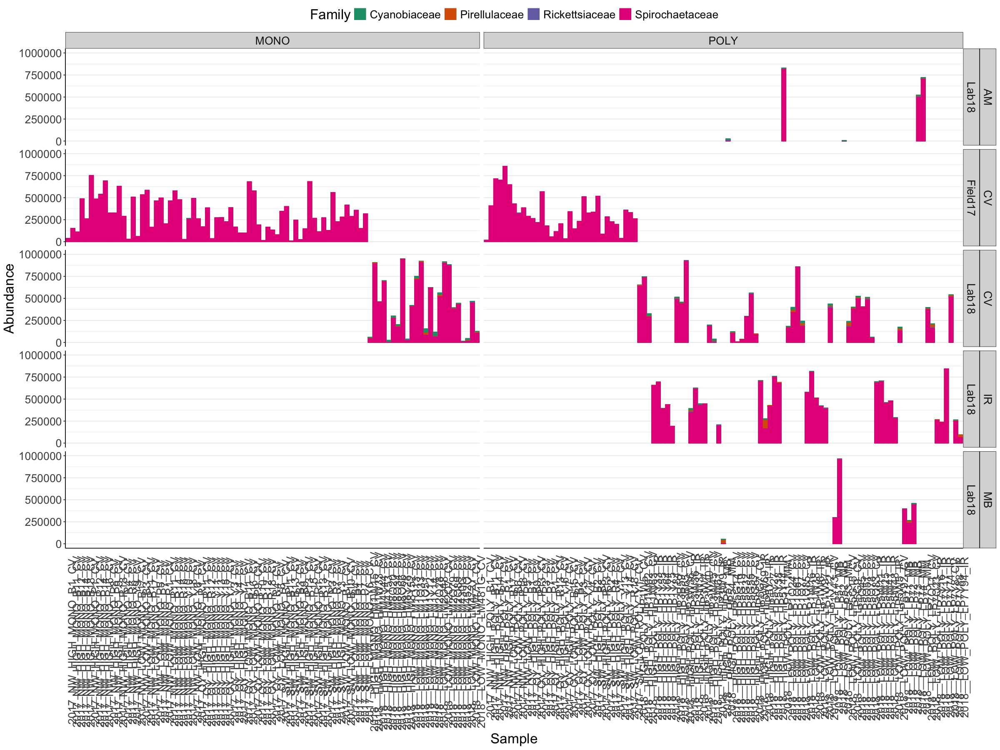

In [91]:
mycolors= colorRampPalette(brewer.pal(8, "Dark2"))(8)

plot_bar(DE_core,  fill="Family") +
facet_grid(Species+Experiment~Treatment2_Diversity, scales="free_x", space="free")+
geom_bar(aes(color=Family, fill=Family), stat="identity", position="stack")+
scale_fill_manual(values=mycolors, drop=TRUE)+
scale_color_manual(values=mycolors, drop=TRUE)+
theme_bw()+
ylim(0,1000000)+
theme(legend.position="top", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text.x=element_text(angle=90),
          text = element_text(size=20))

In [149]:
ggsave(width=30, height=20, file="~/Documents/DE/Figures/Core_otus.pdf")

Warning message:
“Removed 618 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 618 rows containing missing values or values outside the scale range (`geom_bar()`).”


In [51]:
mycolors= colorRampPalette(brewer.pal(8, "Dark2"))(52)

In [54]:
mycolors=sample(mycolors, 52)

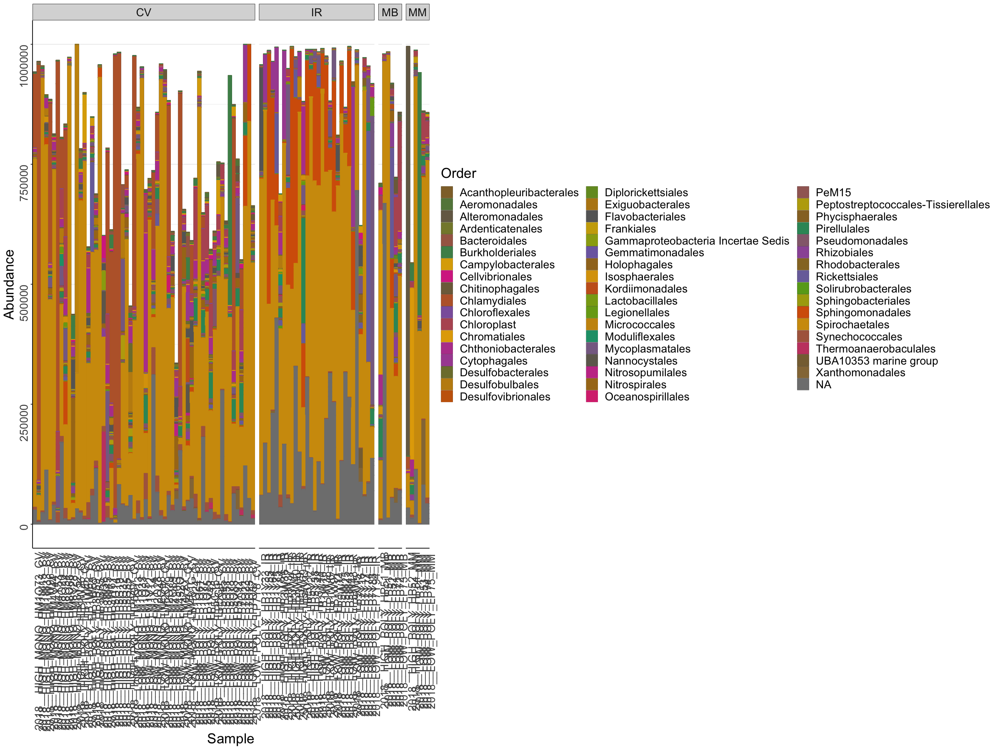

In [55]:
plot_bar(DE18_species100,  fill="Order") +
facet_grid(.~Species, scales="free_x", space="free")+
geom_bar(aes(color=Order, fill=Order), stat="identity", position="stack")+
scale_fill_manual(values=mycolors, drop=TRUE)+
scale_color_manual(values=mycolors, drop=TRUE)+
theme_bw()+
theme(legend.position="right", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text=element_text(angle=90),
          text = element_text(size=20))

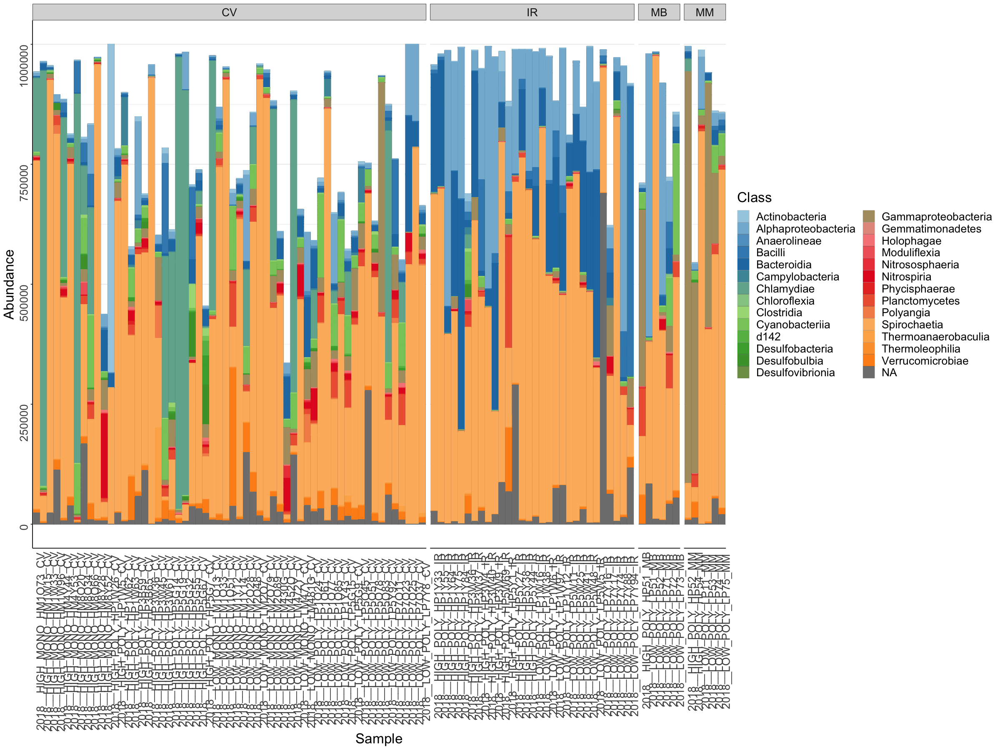

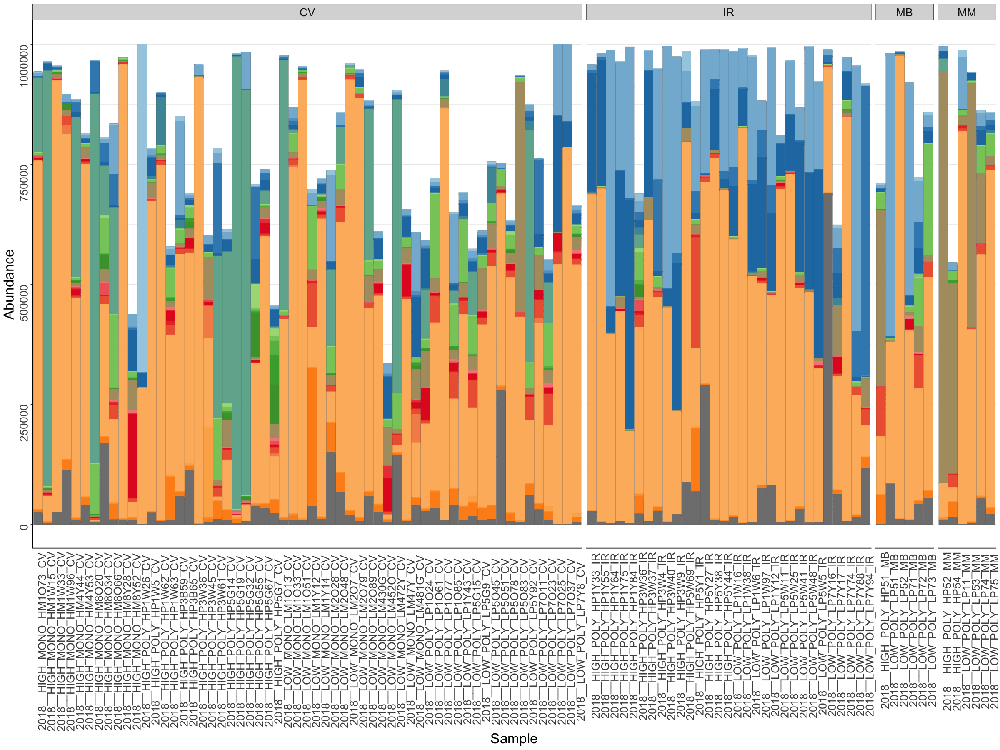

In [64]:
plot_bar(DE18_species100,  fill="Class") +
facet_grid(.~Species, scales="free_x", space="free")+
geom_bar(aes(color=Class, fill=Class), stat="identity", position="stack")+
scale_fill_manual(values=mycolors, drop=TRUE)+
scale_color_manual(values=mycolors, drop=TRUE)+
theme_bw()+
theme(legend.position="none", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text=element_text(angle=90),
          text = element_text(size=20))

In [68]:
taxmap100 = parse_phyloseq(DE18_species100)


The following 132 of 211 (62.6%) input indexes have `NA` in their classifications:
   1, 2, 4, 6, 7, 8, 10, 12 ... 198, 199, 200, 201, 202, 203, 207




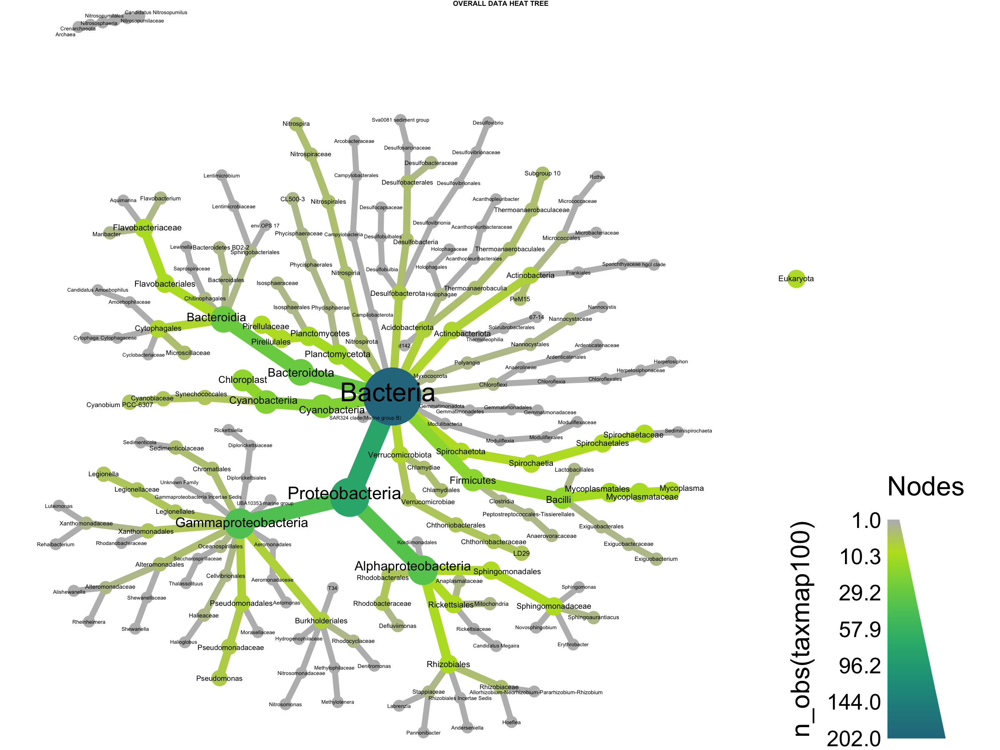

In [72]:
taxmap100 %>% 
  heat_tree(node_label = taxon_names,
            node_size = n_obs(taxmap100),
            node_color = n_obs(taxmap100),
            layout = "da", initial_layout = "re")+
  ggtitle("OVERALL DATA HEAT TREE")+
  theme(plot.title=element_text(hjust=0.5, vjust=0.7, face="bold", colour='Black', size=10))



In [76]:
taxmapCV100 = parse_phyloseq(DE18CV_100)


The following 64 of 100 (64%) input indexes have `NA` in their classifications:
   1, 2, 4, 6, 7, 8, 10, 12, 14 ... 87, 91, 92, 93, 94, 95, 96, 97




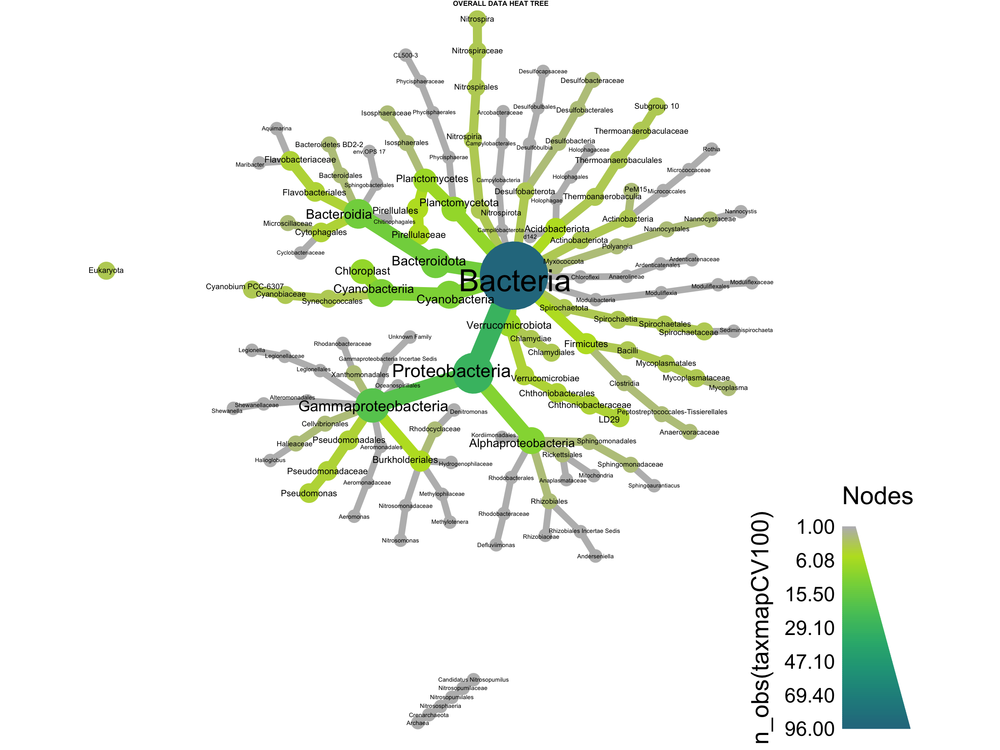

In [77]:
taxmapCV100 %>% 
  heat_tree(node_label = taxon_names,
            node_size = n_obs(taxmapCV100),
            node_color = n_obs(taxmapCV100),
            layout = "da", initial_layout = "re")+
  ggtitle("OVERALL DATA HEAT TREE")+
  theme(plot.title=element_text(hjust=0.5, vjust=0.7, face="bold", colour='Black', size=10))



In [78]:
taxmapM100 = parse_phyloseq(DE18M_100)


The following 65 of 100 (65%) input indexes have `NA` in their classifications:
   1, 2, 3, 4, 5, 6, 7, 8, 10 ... 87, 88, 90, 91, 94, 96, 98, 100




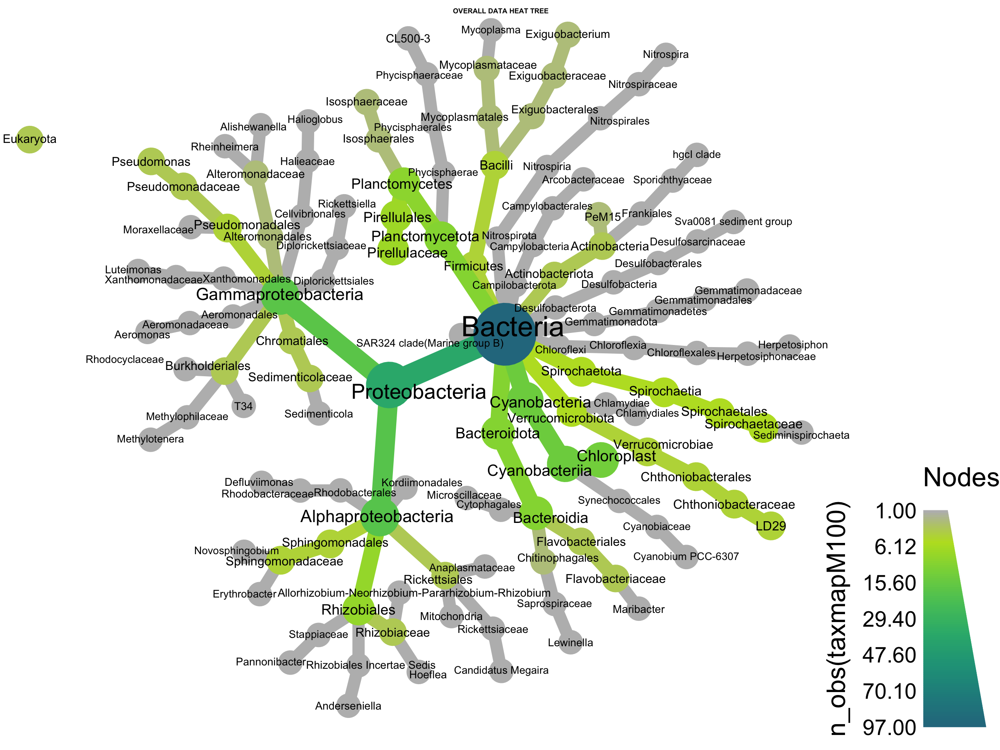

In [79]:
taxmapM100 %>% 
  heat_tree(node_label = taxon_names,
            node_size = n_obs(taxmapM100),
            node_color = n_obs(taxmapM100),
            layout = "da", initial_layout = "re")+
  ggtitle("OVERALL DATA HEAT TREE")+
  theme(plot.title=element_text(hjust=0.5, vjust=0.7, face="bold", colour='Black', size=10))


In [80]:
taxmapIR100 = parse_phyloseq(DE18IR_100)


The following 67 of 100 (67%) input indexes have `NA` in their classifications:
   1, 2, 3, 4, 6, 7, 8, 10, 12 ... 86, 87, 88, 89, 90, 91, 92, 96




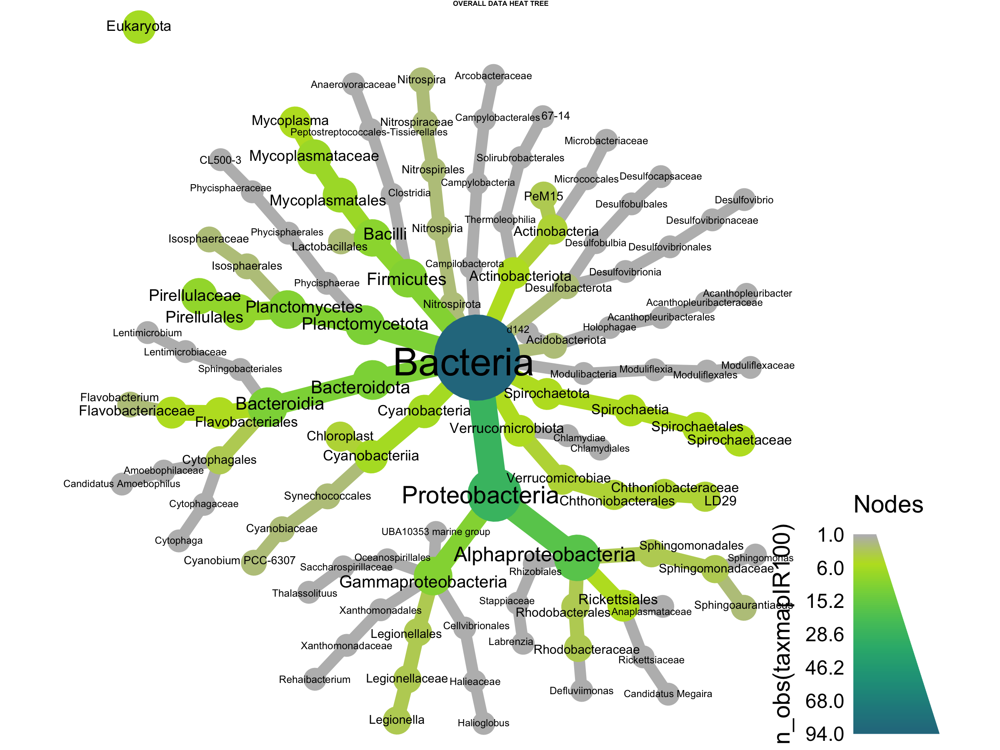

In [81]:
taxmapIR100 %>% 
  heat_tree(node_label = taxon_names,
            node_size = n_obs(taxmapIR100),
            node_color = n_obs(taxmapIR100),
            layout = "da", initial_layout = "re")+
  ggtitle("OVERALL DATA HEAT TREE")+
  theme(plot.title=element_text(hjust=0.5, vjust=0.7, face="bold", colour='Black', size=10))


In [130]:
#top 100 taxa
DE_100 = prune_taxa(names(sort(taxa_sums(DE),TRUE)[1:100]), DE)

In [128]:
DE17

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 7662 taxa and 98 samples ]
sample_data() Sample Data:       [ 98 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 7662 taxa by 6 taxonomic ranks ]

In [130]:
DE17.ord <- ordinate(DE17, "NMDS", "bray", trymax=10000)

Square root transformation
Wisconsin double standardization
Run 0 stress 0.2697321 
Run 1 stress 0.2729587 
Run 2 stress 0.2736233 
Run 3 stress 0.2772509 
Run 4 stress 0.2736 
Run 5 stress 0.2727078 
Run 6 stress 0.2709037 
Run 7 stress 0.2764933 
Run 8 stress 0.2690616 
... New best solution
... Procrustes: rmse 0.06279037  max resid 0.2389323 
Run 9 stress 0.2700639 
Run 10 stress 0.2753308 
Run 11 stress 0.2781889 
Run 12 stress 0.279265 
Run 13 stress 0.2807666 
Run 14 stress 0.2788152 
Run 15 stress 0.2749958 
Run 16 stress 0.2756564 
Run 17 stress 0.2742411 
Run 18 stress 0.2699384 
Run 19 stress 0.2718821 
Run 20 stress 0.2792591 
Run 21 stress 0.2720749 
Run 22 stress 0.276148 
Run 23 stress 0.2728968 
Run 24 stress 0.2762785 
Run 25 stress 0.2739293 
Run 26 stress 0.2787691 
Run 27 stress 0.2765767 
Run 28 stress 0.2758059 
Run 29 stress 0.2769946 
Run 30 stress 0.2748925 
Run 31 stress 0.2728845 
Run 32 stress 0.282545 
Run 33 stress 0.278397 
Run 34 stress 0.2682708 
... Ne

Warning message in postMDS(out$points, dis, plot = max(0, plot - 1), ...):
“skipping half-change scaling: too few points below threshold”


In [137]:
DE17.ord


Call:
metaMDS(comm = veganifyOTU(physeq), distance = distance, trymax = 10000) 

global Multidimensional Scaling using monoMDS

Data:     wisconsin(sqrt(veganifyOTU(physeq))) 
Distance: bray 

Dimensions: 2 
Stress:     0.2668987 
Stress type 1, weak ties
Two convergent solutions found after 2648 tries
Scaling: centring, PC rotation 
Species: expanded scores based on ‘wisconsin(sqrt(veganifyOTU(physeq)))’ 


In [131]:
DE17sd=pssd2veg(DE17)
DE17otu=psotu2veg(DE17)

In [132]:
DE17.envfit=envfit(DE17.ord~Site*RFTM_score, data=DE17sd, permutations=999, na.rm=TRUE)


In [133]:
#pull out scores
DE17.scores=as.data.frame(scores(DE17.ord, display="sites"))
#attach metadata
DE17.scores=cbind(DE17.scores, DE17sd)

In [134]:
DE17.centroids=as.data.frame(scores(DE17.envfit, display="factors"))

In [135]:
mycolors= colorRampPalette(brewer.pal(8, "Dark2"))(4)

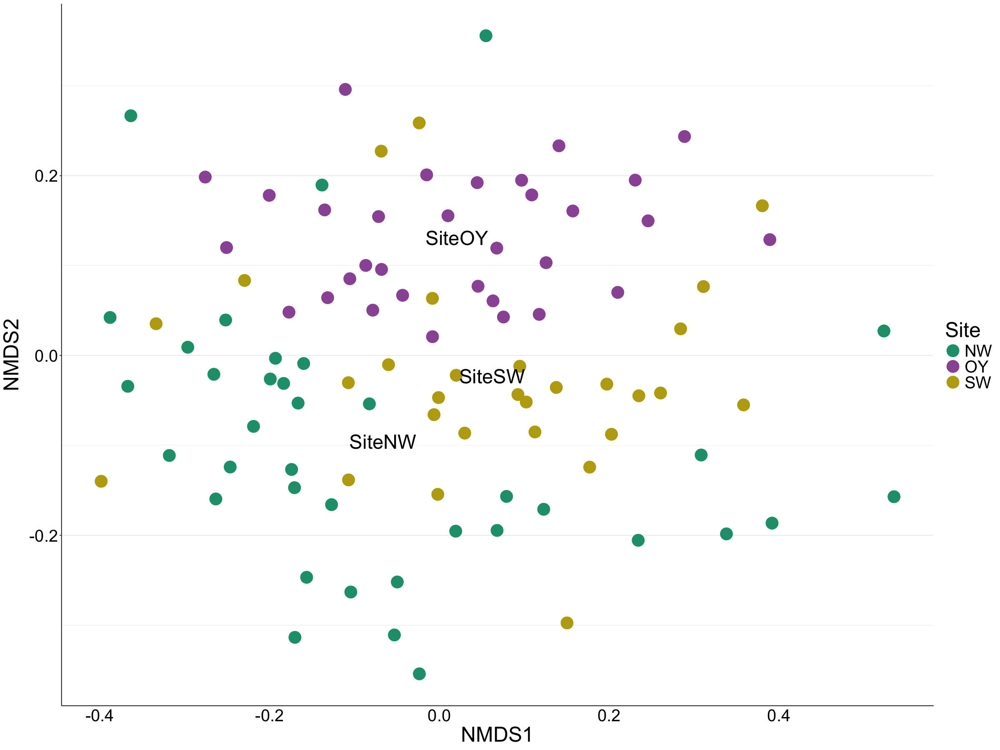

In [136]:
ggplot(DE17.scores, aes(x=NMDS1, y=NMDS2))+
geom_point(aes(NMDS1, NMDS2, color=Site), size=8)+
theme_bw()+
scale_color_manual(values=mycolors, drop=TRUE)+
geom_text(data = DE17.centroids, aes(label = rownames(DE17.centroids),y = NMDS2, x = NMDS1), size=10)+
#geom_segment(data = SF5.scores, aes(x = 0, xend=NMDS1, y=0, yend=NMDS2), arrow = arrow(length = unit(0.25, "cm")), colour = "grey10", lwd=0.3) + 
 #ggrepel::geom_text_repel(data = sig.env.scrs, aes(x=NMDS1, y=NMDS2, label = env.variables), cex = 4, direction = "both", segment.size = 0.25)
 theme(legend.position="right", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text=element_text(color="black"),
          text = element_text(size=30))

In [138]:
ggsave(file="~/Documents/DE/16S_manuscript/Submit/FigureS6.pdf", width = 15, height=10)

In [115]:
adonis2(vegdist(DE17otu, method="bray") ~ Site*RFTM_score*peacrabs, data=DE17sd)


,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Site,2,1.7621865,0.074933730,3.8611005,0.001
RFTM_score,1,0.2751773,0.011701405,1.2058735,0.213
peacrabs,1,0.3241450,0.013783668,1.4204586,0.132
Site:RFTM_score,2,0.5462318,0.023227497,1.1968402,0.195
Site:peacrabs,1,0.1852605,0.007877862,0.8118431,0.663
RFTM_score:peacrabs,1,0.1460494,0.006210483,0.6400135,0.836
Site:RFTM_score:peacrabs,1,0.1961742,0.008341944,0.8596685,0.581
Residual,88,20.0813753,0.853923411,NA,NA
Total,97,23.5166000,1.000000000,NA,NA


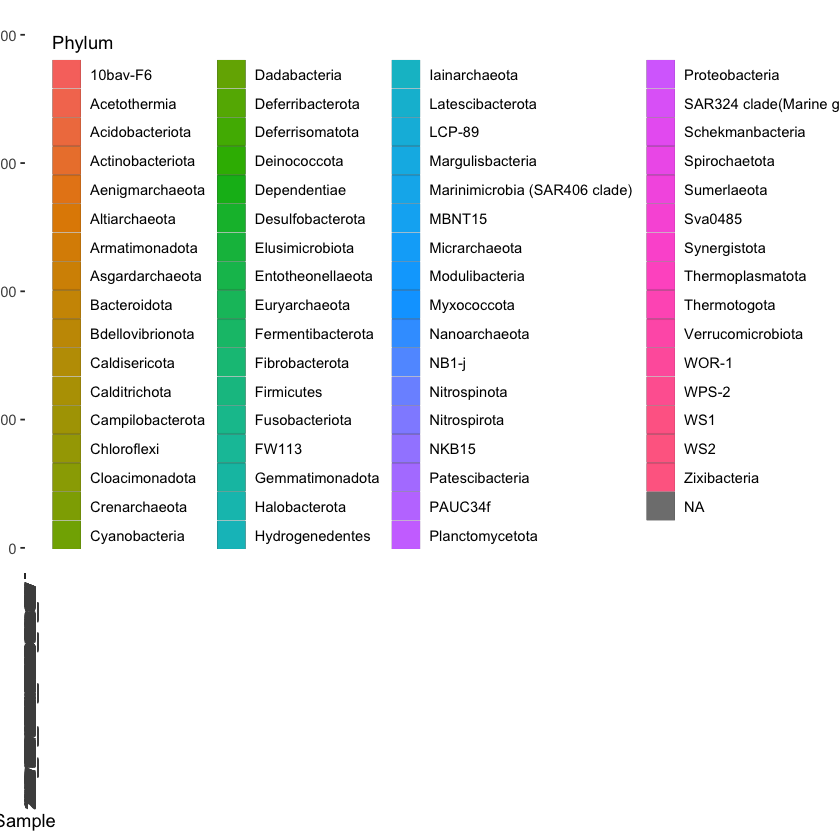

In [48]:
plot_bar(DE17,  fill="Phylum") +
geom_bar(aes(color=Phylum, fill=Phylum), stat="identity", position="stack")+
theme_bw()+
theme(axis.text.x = element_text(angle = 90))


In [50]:
DE17

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 14760 taxa and 112 samples ]
sample_data() Sample Data:       [ 112 samples by 17 sample variables ]
tax_table()   Taxonomy Table:    [ 14760 taxa by 6 taxonomic ranks ]

In [29]:
DE17.ord <- ordinate(DE17, "NMDS", "bray", trymax=500, k=3)

Square root transformation
Wisconsin double standardization
Run 0 stress 0.1948345 
Run 1 stress 0.192946 
... New best solution
... Procrustes: rmse 0.03264774  max resid 0.1183562 
Run 2 stress 0.1928993 
... New best solution
... Procrustes: rmse 0.01466103  max resid 0.1163907 
Run 3 stress 0.1924374 
... New best solution
... Procrustes: rmse 0.02102737  max resid 0.1652987 
Run 4 stress 0.1927069 
... Procrustes: rmse 0.01937163  max resid 0.1224901 
Run 5 stress 0.1952571 
Run 6 stress 0.192876 
... Procrustes: rmse 0.02178836  max resid 0.1651457 
Run 7 stress 0.1953617 
Run 8 stress 0.1944204 
Run 9 stress 0.1934084 
Run 10 stress 0.1929899 
Run 11 stress 0.1944306 
Run 12 stress 0.1947779 
Run 13 stress 0.1945414 
Run 14 stress 0.1927832 
... Procrustes: rmse 0.01411714  max resid 0.09268446 
Run 15 stress 0.192892 
... Procrustes: rmse 0.02139736  max resid 0.1643968 
Run 16 stress 0.19371 
Run 17 stress 0.197538 
Run 18 stress 0.1952288 
Run 19 stress 0.1924415 
... Procrus

Run 189 stress 0.192877 
... Procrustes: rmse 0.02187432  max resid 0.1653081 
Run 190 stress 0.1979205 
Run 191 stress 0.1953026 
Run 192 stress 0.196641 
Run 193 stress 0.1943105 
Run 194 stress 0.1956947 
Run 195 stress 0.193937 
Run 196 stress 0.1976239 
Run 197 stress 0.1956045 
Run 198 stress 0.1967556 
Run 199 stress 0.1926543 
... Procrustes: rmse 0.007774715  max resid 0.07175953 
Run 200 stress 0.1982741 
Run 201 stress 0.1929504 
Run 202 stress 0.1940934 
Run 203 stress 0.1950311 
Run 204 stress 0.1949195 
Run 205 stress 0.192709 
... Procrustes: rmse 0.01316806  max resid 0.09142544 
Run 206 stress 0.1928923 
... Procrustes: rmse 0.01261806  max resid 0.1146624 
Run 207 stress 0.1943848 
Run 208 stress 0.1960686 
Run 209 stress 0.1958806 
Run 210 stress 0.1932996 
Run 211 stress 0.1948993 
Run 212 stress 0.194505 
Run 213 stress 0.1928275 
... Procrustes: rmse 0.02038205  max resid 0.1226844 
Run 214 stress 0.1928251 
... Procrustes: rmse 0.02018889  max resid 0.1222235 
Ru

Warning message in postMDS(out$points, dis, plot = max(0, plot - 1), ...):
“skipping half-change scaling: too few points below threshold”


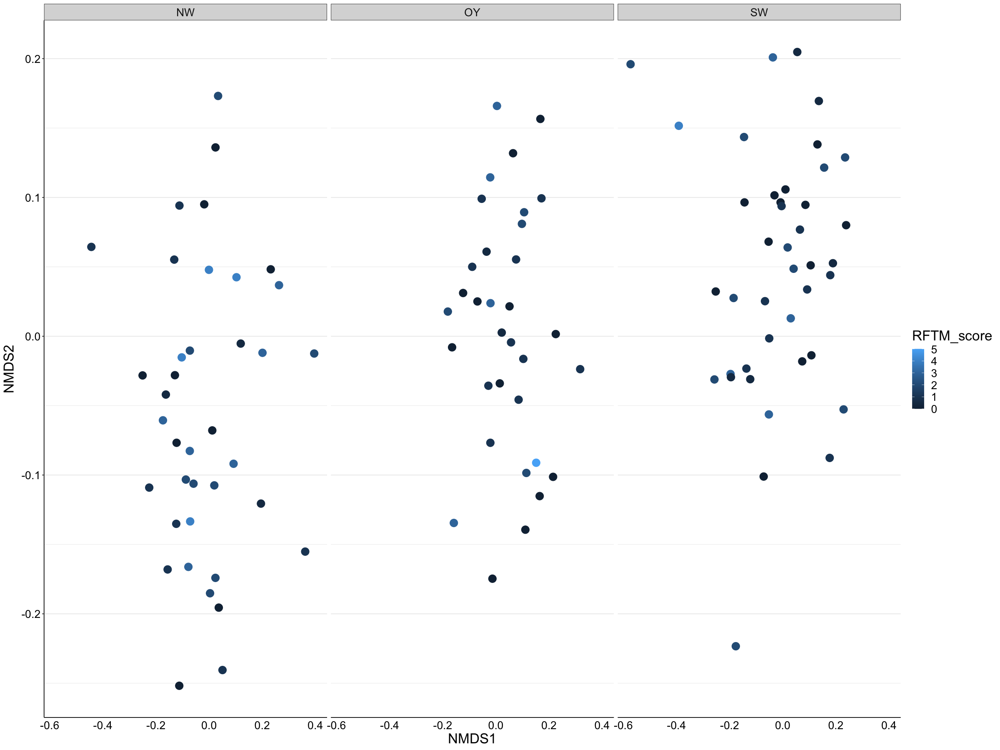

In [35]:
plot_ordination(DE17, DE17.ord, type="samples", color="RFTM_score")+ 
facet_wrap("Site")+
#geom_polygon(aes(fill=Phase_1_DO))+ 
geom_point(size=5)+
theme_bw()+
 theme(legend.position="right", panel.border = element_blank(), 
          panel.grid.major.x = element_blank(), 
          panel.grid.minor.x = element_blank(),
          axis.ticks.x=element_blank(), axis.line=element_line(color="black"), axis.text=element_text(color="black"),
          text = element_text(size=20))

In [52]:
mycolors= colorRampPalette(brewer.pal(8, "Dark2"))(23)


In [46]:
mycolors

[1] "#1B9E77" "#548A53" "#8E772F" "#C8640C" "#C36228" "#A4675E" "#866D94"
 [8] "#8366AD" "#A651A1" "#C93B94" "#E12E85" "#BA5464" "#927A43" "#6BA022"
[15] "#87A716" "#AEA80E" "#D5AA05" "#DAA106" "#C7910E" "#B38117" "#A07423"
[22] "#8C6F39" "#796A4F" "#666666"

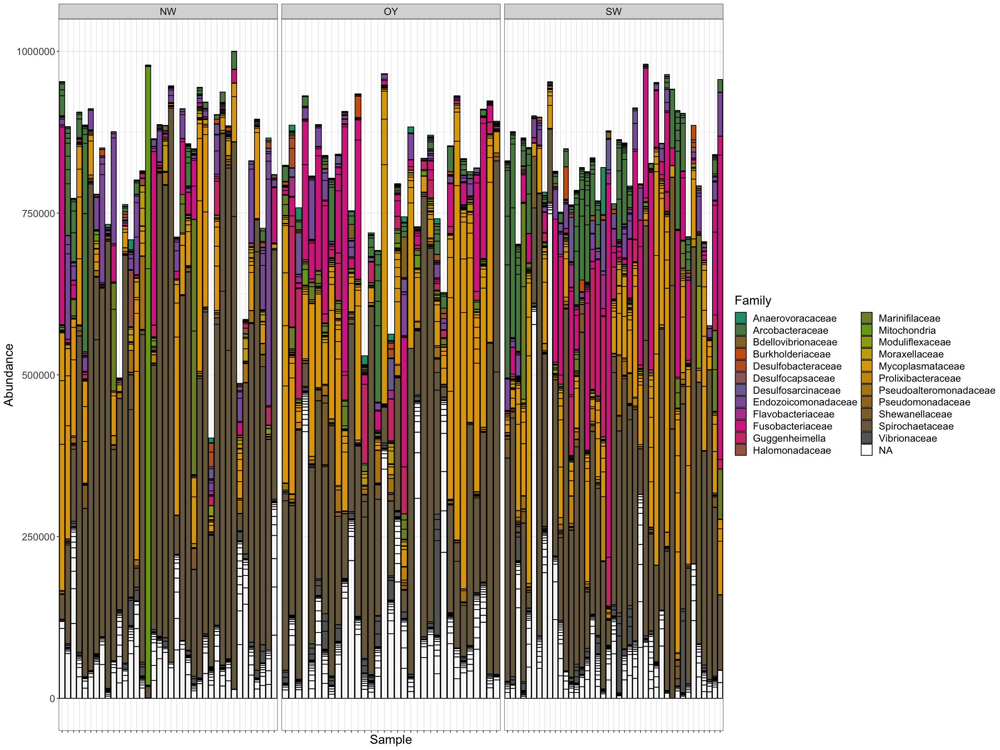

In [53]:
DE17_100 = prune_taxa(names(sort(taxa_sums(DE17),TRUE)[1:100]), DE17)
plot_bar(DE17_100, fill="Family")+
theme_bw()+
scale_fill_manual(values=mycolors)+
theme(legend.position = "right", text = element_text(size=18), axis.text.x = element_blank())+
facet_grid(.~Site, scales="free_x")


In [54]:
ggsave(width=15, height=8, file="~/Documents/DE/DE_16S/DE17top100OTUs.pdf")

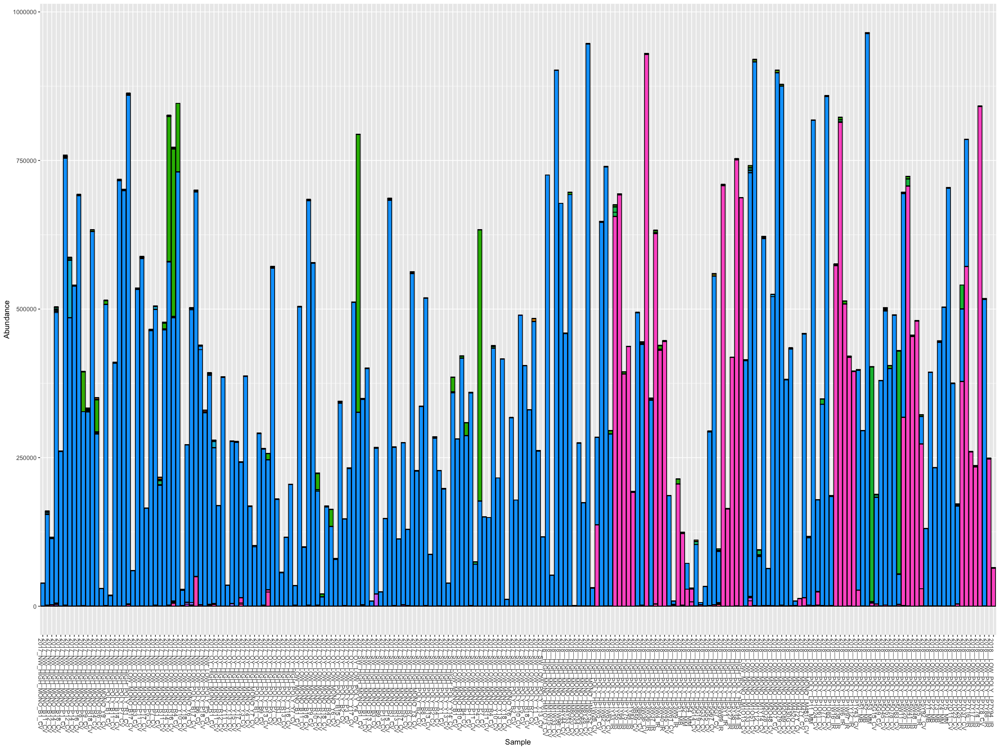

In [63]:
DE_Spiro = subset_taxa(DE, Phylum=="Spirochaetota")
plot_bar(DE_Spiro, fill="OTU")+
theme(legend.position = "none")

In [46]:
DE17_Spiro = subset_taxa(DE17, Phylum=="Spirochaetota")
DE17_Spirof = filter_taxa(DE17_Spiro, function(x) mean(x) > 100, TRUE)

ERROR: Error: Unsupported class: phyloseq


In [47]:
mycolors= colorRampPalette(brewer.pal(6, "Dark2"))(10)

In [51]:
mycolors

[1] "#1B9E77" "#847B36" "#CD6015" "#966A77" "#8E60A9" "#CD3893" "#BC5266"
 [8] "#74982A" "#9EA811" "#E6AB02"

In [76]:
taxa_names(DE17_Spirof)

[1] "TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG"                 
[2] "TACGTAAGGAGCGAGCGTTGTTCGGAATTATTGGGCGTAAAGTGCGTGCAGGCTGTTTATTAAGTCTGATGTGAAAGTGCACAGCTTAACTGTGTTGTTGCGTTGGAAACTGGTAAACTAGAATTCGAGAGAGGAAATTGGAATTCCTGGTGTAGGGGTGAAATCTGTTGATATCAGGAAGAACACCTGAGGCGAAAGCGAATTTCTGGCTCTGAATTGACGCTGTAGCGCGAAAGCGTAGGGAGCAAACAGG"                   
[3] "TACGTAAGGAGCGAGCGTTGTTCGGAATTATTGGGCGTAAAGTGCGTGCAGGCGGTTTGCCAAGTCTGATGTGAAAGCATACAGCTCAACTGTATTGTTGCGTTGGAAACTGGTGAACTAGAATTCGAGAGAGGAAATTGGAATTCCTGGTGTAGGGGTGAAATCTGTTGATATCAGGAAGAACACCTGAGGCGAAAGCGAATTTCTGGCTCTGAATTGACGCTGAAGCGCGAAAGCGTAGGGAGCAAACAGG"                   
[4] "TACGTATGGGGCAAACGTTGTTCGGATTCACTGGGCGTAAAGAGTACGTAGGCTGTCGAGACAGTCAATGATCAAATCCCGTAGCTTAACTACGTGGTCGTTGTTGATACTTCTCGACTAGAGTTTTATAGAGGTAGCGGGAATTCCTGGTGTAGGGGTGAAATCTGTTGATATCAGGAGGAACACCAAAGGCGAAGGCAAGCTACTGGGTAAAAACTGACGCTGAGGTACGAAAGCCAGGGGAGCAAATGGG"                   
[5] "TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCAGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG"                 
[6] "TACGTATGGGGCAAACGTTGTTCGGATTCACTGGGCGTAAAGAGTACGTAGGCTGTCGAGACAGTCAATGATCAAATCCCGTAGCTTAACTACGTGGTCGTTGTTGATACTTCTCGACTAGAGTTTTATAGAGGTAGCAGGAATTCCTGGTGTAGGGGTGAAATCTGTTGATATCAGGAGGAACACCAAAGGCGAAGGCAAGCTACTGGGTAAAAACTGACGCTGAGGTACGAAAGCCAGGGGAGCAAATGGG"                   
[7] "TACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGTTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG"                 
[8] "TACGTAAGGGGCGAGCGTTGTTCGGAATTATTGGGCGTAAAGGGCGTGTAGGCGGTCTTGAAAGTCTGGAGTTAAAGACCACAGCTTAACTGTGGGAGTGCTTCGGAAACTGCAAGACTAGAATCTAGCAGGGGTAATCGGAATTTCTAGTGTAGGGGTGAAATCTGTTGATATTAGAAAGAACACCAGAGGCGAAGGCGGATTACTGGGTTAAGATTGACGCTGAGGCGCGAAAGCGTAGGTAGCAAACAGG"                   
[9] "GTGTCAGCGCGCGGTAATACGTAGGGGGCGAACGTTGTTCGGAATCACTGGGCGTAAAGGGTGCGCAGGCTGCTCATCAAGTCAGTTGTGAAATTTCGTGGCTCAACCACGAAGCTGCTGCTGATACTGTTGGGCTAGAGTCATAGATAGAGGTAGCGGGAATTCCTGGTGTAGGAGTGAAATCTGTAGATATCAGGAGGAACACCAAGGGTGAAGACAAGCTACTGGGTAATGACTGACGCTGAGGCACGAAAGCTAGGGGAGCAAATGGG"

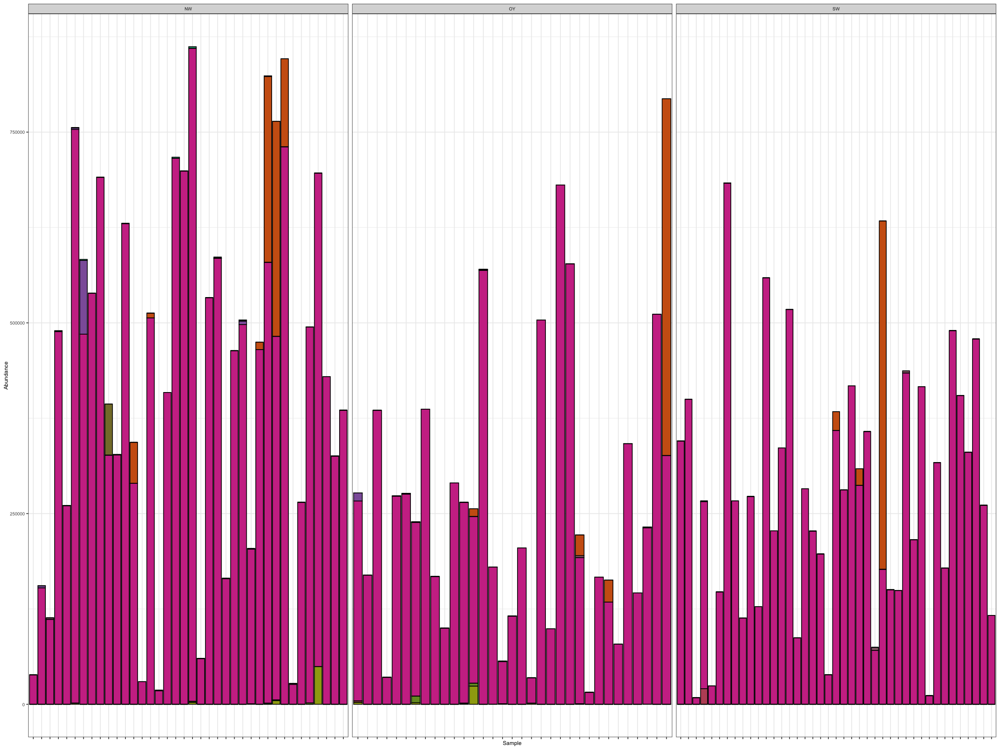

In [50]:
plot_bar(DE17_Spirof, fill="OTU")+
scale_fill_manual(values=mycolors)+
theme_bw()+
theme(legend.position = "none", text = element_text(size=8), axis.text.x = element_blank())+
facet_grid(.~Site, scales="free_x")


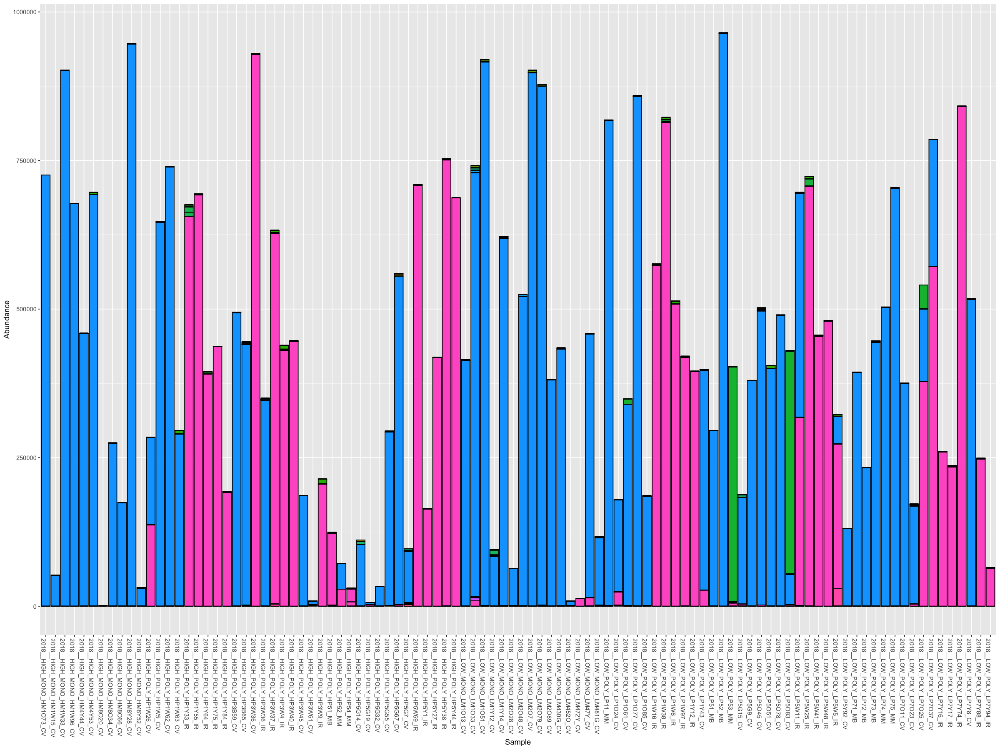

In [61]:
DE18_Spiro = subset_taxa(DE18, Phylum=="Spirochaetota")
plot_bar(DE18_Spiro, fill="OTU")+
theme(legend.position = "none")